## End to end training example

This notebook contains an end to end example of using LPIPS.


The example here is single-image super-resolution, the process where a low spatial resolution (and perhaps noisy) image is up-scaled using a neural network.

The Enhanced Deep Super-resolution (EDSR) architecture is used (a simple version at least anyway). Credit to the authors of EDSR (https://arxiv.org/abs/1707.02921).

A popular single-image super-resolution dataset is used here, the Div2K dataset (https://data.vision.ee.ethz.ch/cvl/DIV2K/). This repository doesn't provide these images, you'll need to download them yourself.

Modify the arguments in the second cell below (e.g., data_dir variable) and run the notebook!

N.B., this notebook does not intend to produce SOTA super-resolution, rather, just a showcase of LPIPS in a Tensorflow environment. Should also be noted using a VGG16 base (i.e., BASE = 'vgg16') produces the most visually pleasing results.

In [1]:
import os

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import torchvision # Just for loading in images.

from dev_src.loss_fns import lpips_base_tf

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

2024-06-14 09:32:59.036175: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-14 09:32:59.712953: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Num GPUs Available:  2


In [2]:
# ARGUMENTS

data_dir = os.path.abspath("../../Documents/DIV2K")

BASE = 'vgg16' # options 'alex', 'vgg16', and 'squeeze'.

HR_TRACK_TRAIN = "DIV2K_train_HR"
LR_TRACK_TRAIN = "DIV2K_train_LR_mild"

HR_TRACK_VALID = "DIV2K_valid_HR"
LR_TRACK_VALID = "DIV2K_valid_LR_mild"

DATASET_SIZE = 10000 # the dataset gets augmented for training, specify the size of the resulting dataset.
LABEL_IMAGE_SIZE = (128,128) # the images get randomly cropped.
SCALE_FACTOR = 4 # DO NOT CHANGE.

BATCH_SIZE = 16
EPOCHS = 20
LEARNING_RATE = 1e-5

In [3]:
# defining a loss function that is half LPIPS, half Huber loss.

class LPIPSWithHuberLoss:
    def __init__(self, lpips_loss: tf.keras.Model, alpha: float = 0.5):
        self.lpips_loss = lpips_loss
        self.alpha = alpha # a weighting term
    
    def compute_loss(self, y_true: tf.Tensor, y_pred: tf.Tensor) -> tf.Tensor:
        loss_lpips = self.lpips_loss(y_true, y_pred)
        loss_huber = tf.compat.v1.losses.huber_loss(y_true,y_pred)
        return self.alpha*loss_lpips + (1-self.alpha)*loss_huber

LOSS = lpips_base_tf.LPIPS(BASE, pre_norm=True)
LOSS = LPIPSWithHuberLoss(LOSS, alpha=0.97).compute_loss # alpha value = 0.97 more or less evenly weighs the two loss terms (when base='vgg16')

2024-06-14 09:33:02.249498: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1928] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 46774 MB memory:  -> device: 0, name: NVIDIA RTX A6000, pci bus id: 0000:68:00.0, compute capability: 8.6
2024-06-14 09:33:02.250030: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1928] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 47358 MB memory:  -> device: 1, name: Quadro RTX 8000, pci bus id: 0000:1a:00.0, compute capability: 7.5


fetching base: vgg16
loading base parameters from file
loading lins parameters from file


In [4]:
# some helper functions for loading in things.

def load_image(path: str) -> tf.Tensor:
    return torchvision.io.read_image(path, torchvision.io.ImageReadMode.RGB).float()

def transpose_image(img: tf.Tensor) -> tf.Tensor:
    return tf.transpose(img, [1, 2, 0])

def grab_images(path: str, max_num: int = 100) -> list[tf.Tensor]:
    return [transpose_image(load_image(os.path.join(path,subpath))) for subpath in sorted(os.listdir(path))[:max_num]] # take a small portion for memory considerations.

In [5]:
hr_images = grab_images(os.path.join(data_dir, HR_TRACK_TRAIN))
lr_images = grab_images(os.path.join(data_dir, LR_TRACK_TRAIN))

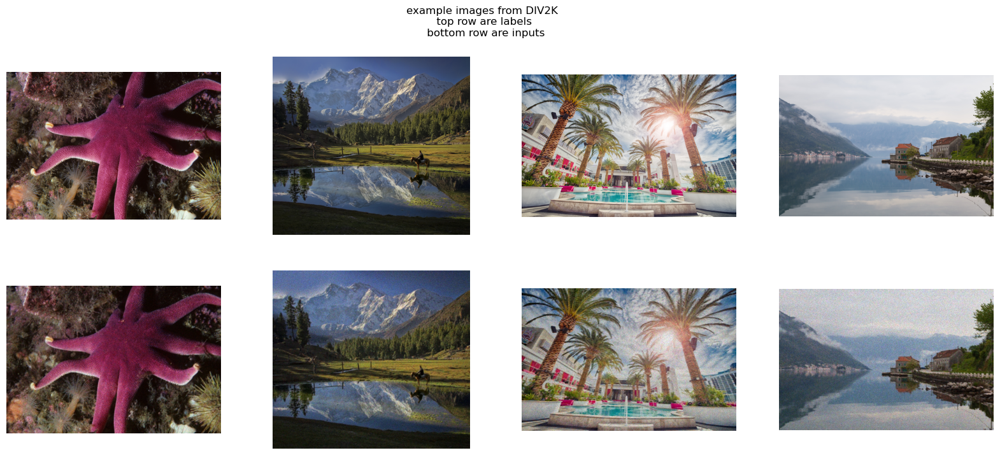

In [6]:
# let's plot a few.

fig, ax = plt.subplots(2, 4, figsize=(20,8))
ax[0,0].imshow(hr_images[0].numpy().astype(int))
ax[0,0].axis('off')

ax[1,0].imshow(lr_images[0].numpy().astype(int))
ax[1,0].axis('off')

ax[0,1].imshow(hr_images[1].numpy().astype(int))
ax[0,1].axis('off')

ax[1,1].imshow(lr_images[1].numpy().astype(int))
ax[1,1].axis('off')

ax[0,2].imshow(hr_images[2].numpy().astype(int))
ax[0,2].axis('off')

ax[1,2].imshow(lr_images[2].numpy().astype(int))
ax[1,2].axis('off')

ax[0,3].imshow(hr_images[3].numpy().astype(int))
ax[0,3].axis('off')

ax[1,3].imshow(lr_images[3].numpy().astype(int))
ax[1,3].axis('off')

plt.suptitle('example images from DIV2K \n top row are labels \n bottom row are inputs')
plt.show()

In [7]:
def generate_augmented_dataset(hr_images: list, lr_images: list, 
        dataset_size: int, label_image_size: tuple[int,int] = (128,128), 
        scale_factor: int = 4) -> tuple[list[tf.Tensor], list[tf.Tensor]]:
    
    hr_augmented = []
    lr_augmented = []
    for _ in range(dataset_size):
        idx = tf.random.uniform(shape=(), minval=0, maxval=len(hr_images), dtype=tf.int32).numpy().astype(int)
        random_x = tf.random.uniform(shape=(), minval=0, maxval=lr_images[idx].shape[0] - label_image_size[0], dtype=tf.int32).numpy().astype(int)
        random_y = tf.random.uniform(shape=(), minval=0, maxval=lr_images[idx].shape[1] - label_image_size[1], dtype=tf.int32).numpy().astype(int)
        hr_augmented.append(hr_images[idx][random_x*scale_factor : label_image_size[0] + random_x*scale_factor, random_y*scale_factor : label_image_size[1] + random_y*scale_factor, :])
        lr_augmented.append(lr_images[idx][random_x : label_image_size[0]//scale_factor + random_x, random_y : label_image_size[1]//scale_factor + random_y, :])
        
    return hr_augmented, lr_augmented
        
hr_images_augmented, lr_images_augmented = generate_augmented_dataset(hr_images, lr_images, DATASET_SIZE, LABEL_IMAGE_SIZE, SCALE_FACTOR)

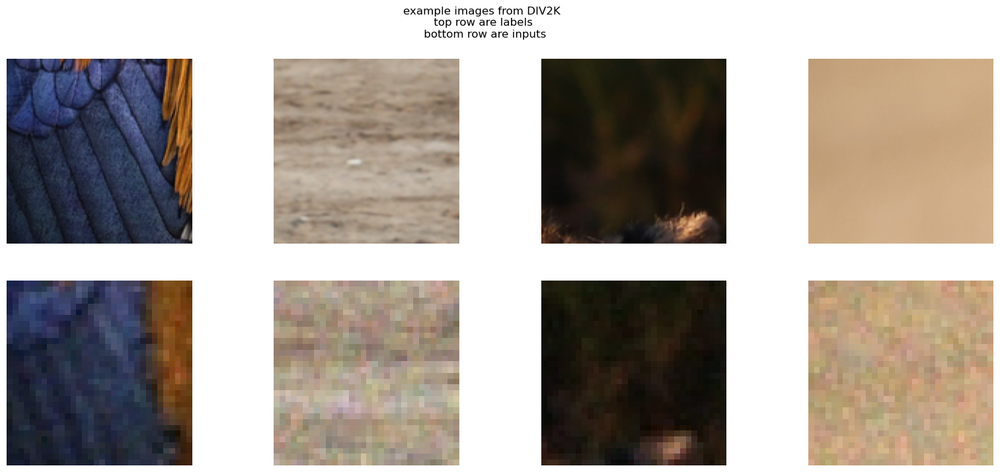

In [8]:
# let's plot a few.

fig, ax = plt.subplots(2, 4, figsize=(20,8))
ax[0,0].imshow(hr_images_augmented[0].numpy().astype(int))
ax[0,0].axis('off')

ax[1,0].imshow(lr_images_augmented[0].numpy().astype(int))
ax[1,0].axis('off')

ax[0,1].imshow(hr_images_augmented[1].numpy().astype(int))
ax[0,1].axis('off')

ax[1,1].imshow(lr_images_augmented[1].numpy().astype(int))
ax[1,1].axis('off')

ax[0,2].imshow(hr_images_augmented[2].numpy().astype(int))
ax[0,2].axis('off')

ax[1,2].imshow(lr_images_augmented[2].numpy().astype(int))
ax[1,2].axis('off')

ax[0,3].imshow(hr_images_augmented[3].numpy().astype(int))
ax[0,3].axis('off')

ax[1,3].imshow(lr_images_augmented[3].numpy().astype(int))
ax[1,3].axis('off')

plt.suptitle('example images from DIV2K \n top row are labels \n bottom row are inputs')
plt.show()

In [9]:
hr_images_tensor = tf.convert_to_tensor(hr_images_augmented)
lr_images_tensor = tf.convert_to_tensor(lr_images_augmented)

print(f'hr dataset shape: {hr_images_tensor.shape} | [num, sdim_x, sdim_y, ch]')
print(f'lr dataset shape: {lr_images_tensor.shape} | [num, sdim_x, sdim_y, ch]')

hr dataset shape: (10000, 128, 128, 3) | [num, sdim_x, sdim_y, ch]
lr dataset shape: (10000, 32, 32, 3) | [num, sdim_x, sdim_y, ch]


In [10]:
dataset = tf.data.Dataset.from_tensor_slices((lr_images_tensor, hr_images_tensor))
dataset = dataset.shuffle(100).batch(BATCH_SIZE)

In [11]:
# Simple EDSR-style single-image super-resolution neural network.
class EDSR(tf.keras.Model):
    def __init__(self, res_blks: int = 32, n_feats: int = 256, res_factor: float = 0.1, scale_factor: int = 4):
        super(EDSR, self).__init__()
        self.res_blks = res_blks
        self.n_feats = n_feats
        self.res_factor = res_factor
        self.scale_factor = scale_factor

        self._initialise_architecture()

    def _initialise_architecture(self):
        self.head = tf.keras.layers.Conv2D(self.n_feats, kernel_size=3, padding='same')
        self.body = [ResBlock(self.n_feats, self.res_factor) for _ in range(self.res_blks)]
        self.upsampler = Upsampler(self.n_feats)
        self.tail = tf.keras.layers.Conv2D(3, kernel_size=3, padding='same')

    def call(self, input_: tf.Tensor) -> tf.Tensor:
        R_mean, G_mean, B_mean = tf.math.reduce_mean(input_[:,:,:,0]), tf.math.reduce_mean(input_[:,:,:,1]), tf.math.reduce_mean(input_[:,:,:,2])
        input_R = tf.math.subtract(input_[:,:,:,0], R_mean)
        input_G = tf.math.subtract(input_[:,:,:,1], G_mean)
        input_B = tf.math.subtract(input_[:,:,:,2], B_mean)
        input_scaled = tf.stack((input_R, input_G, input_B), axis=3)

        out = self.head(input_scaled)
        out_first = tf.identity(out) # makes a copy of out to add on at the end
        for res_blk in self.body:
            out = res_blk(out)
        out += out_first
        out = self.upsampler(out)
        out = self.tail(out)

        out_R = tf.math.add(out[:,:,:,0], R_mean)
        out_G = tf.math.add(out[:,:,:,1], G_mean)
        out_B = tf.math.add(out[:,:,:,2], B_mean)
        out_scaled = tf.stack((out_R, out_G, out_B), axis=3)
        return out_scaled

class ResBlock(tf.keras.Model):
    def __init__(self, n_feats: int, res_factor: float = 0.1):
        super(ResBlock, self).__init__()
        self.n_feats = n_feats
        self.res_factor = res_factor

        self._initialise_architecture()

    def _initialise_architecture(self):
        self.first_conv = tf.keras.layers.Conv2D(self.n_feats, kernel_size=3, padding='same')
        self.activation = tf.keras.layers.ReLU()
        self.second_conv = tf.keras.layers.Conv2D(self.n_feats, kernel_size=3, padding='same')

    def call(self, input_: tf.Tensor) -> tf.Tensor:
        res = self.first_conv(input_)
        res = self.activation(res)
        res = self.second_conv(res)
        res *= self.res_factor 
        res += input_
        return res

class Upsampler(tf.keras.Model):
    def __init__(self, n_feats: int):
        super(Upsampler, self).__init__()
        self.n_feats = n_feats

        self._initialise_architecture()

    def _initialise_architecture(self):
        self.first_conv = tf.keras.layers.Conv2D(self.n_feats * 4, kernel_size=3, padding='same')
        self.second_conv = tf.keras.layers.Conv2D(self.n_feats * 4, kernel_size=3, padding='same')

    def call(self, input_: tf.Tensor) -> tf.Tensor:
        out = self.first_conv(input_)
        out = tf.nn.depth_to_space(out, 4)
        out = self.second_conv(input_)
        out = tf.nn.depth_to_space(out, 4)
        return out

edsr = EDSR()
_ = edsr(tf.random.uniform((1,32,32,3)))
    

2024-06-14 09:33:27.899009: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8902


In [12]:
edsr.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE),
    loss=LOSS,
    metrics=["mean_squared_error"]
)

edsr.summary()

Model: "edsr"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ ?                      │         7,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block (ResBlock)            │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_1 (ResBlock)          │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_2 (ResBlock)          │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_3 (ResBlock)          │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_4 (ResBlock)          │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_5 (ResBlock)          │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_6 (ResBlock)          │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_7 (ResBlock)          │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_8 (ResBlock)          │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_9 (ResBlock)          │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_10 (ResBlock)         │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_11 (ResBlock)         │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_12 (ResBlock)         │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_13 (ResBlock)         │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_14 (ResBlock)         │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_15 (ResBlock)         │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_16 (ResBlock)         │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_17 (ResBlock)         │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_18 (ResBlock)         │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_19 (ResBlock)         │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_20 (ResBlock)         │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_21 (ResBlock)         │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_22 (ResBlock)         │ ?                      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block_23 (ResBlock)         │ ?                      │     1,180,16

 Total params: 42,494,659 (162.10 MB)

 Trainable params: 42,494,659 (162.10 MB)

 Non-trainable params: 0 (0.00 B)

In [13]:
history = edsr.fit(
    dataset,
    epochs=EPOCHS,
)

Epoch 1/20


/home/james/miniconda3/envs/lpips/lib/python3.12/site-packages/keras/src/optimizers/base_optimizer.py:576: UserWarning: Gradients do not exist for variables ['kernel', 'bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
I0000 00:00:1718321621.441799  885826 service.cc:145] XLA service 0x7f0c18002c60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1718321621.441852  885826 service.cc:153]   StreamExecutor device (0): NVIDIA RTX A6000, Compute Capability 8.6
I0000 00:00:1718321621.441859  885826 service.cc:153]   StreamExecutor device (1): Quadro RTX 8000, Compute Capability 7.5
2024-06-14 09:33:41.837689: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.


  1/625 ━━━━━━━━━━━━━━━━━━━━ 3:57:04 23s/step - loss: 2.7351 - mean_squared_error: 6045.1392

I0000 00:00:1718321631.136065  885826 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


625/625 ━━━━━━━━━━━━━━━━━━━━ 107s 135ms/step - loss: 1.3984 - mean_squared_error: 1569.0350
Epoch 2/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 86s 137ms/step - loss: 1.1474 - mean_squared_error: 1021.7151
Epoch 3/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 86s 137ms/step - loss: 1.0942 - mean_squared_error: 989.8923
Epoch 4/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 86s 137ms/step - loss: 1.0703 - mean_squared_error: 987.8539
Epoch 5/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 86s 137ms/step - loss: 1.0577 - mean_squared_error: 982.4390
Epoch 6/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 86s 137ms/step - loss: 1.0492 - mean_squared_error: 981.5219
Epoch 7/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 86s 137ms/step - loss: 1.0410 - mean_squared_error: 975.3582
Epoch 8/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 86s 137ms/step - loss: 1.0352 - mean_squared_error: 975.7613
Epoch 9/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 86s 137ms/step - loss: 1.0299 - mean_squared_error: 971.8273
Epoch 10/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 86s 137ms/step - loss: 1.0242 - mean_squared_error: 969.86

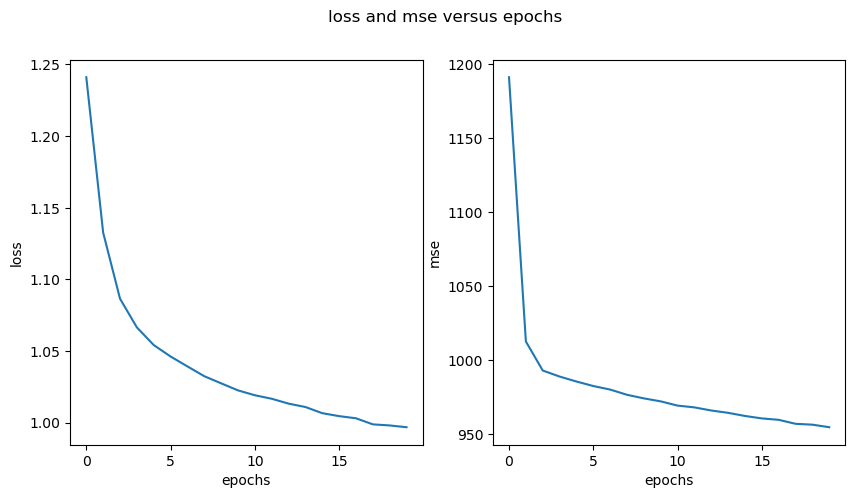

In [14]:
fig, ax = plt.subplots(1, 2, figsize=(10,5))

ax[0].plot(history.history['loss'])
ax[0].set(xlabel='epochs', ylabel='loss')
ax[1].plot(history.history['mean_squared_error'])
ax[1].set(xlabel='epochs', ylabel='mse')
plt.suptitle('loss and mse versus epochs')
plt.show()

In [15]:
hr_images_test = grab_images(os.path.join(data_dir, HR_TRACK_VALID))
lr_images_test = grab_images(os.path.join(data_dir, LR_TRACK_VALID))

In [16]:
yhat = [edsr.predict(tf.expand_dims(lr_images_test[idx], 0)) for idx in range(4)]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


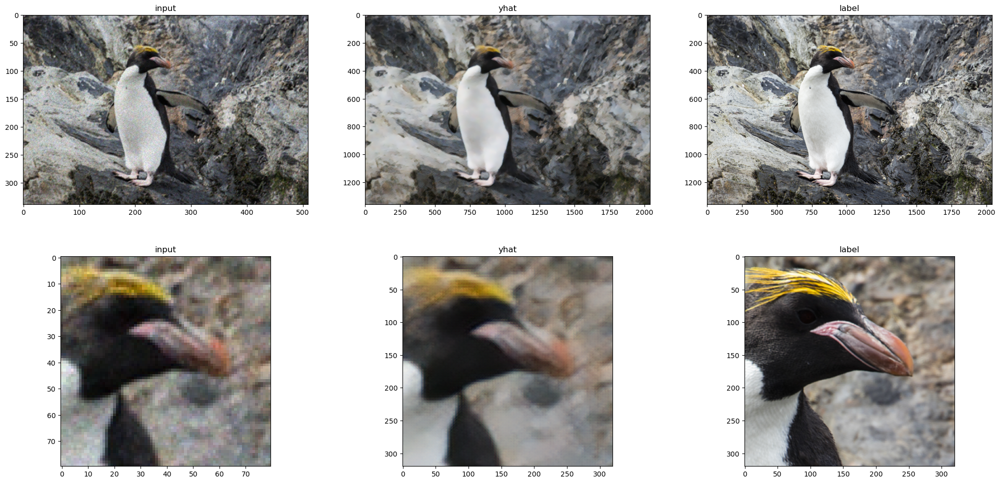

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


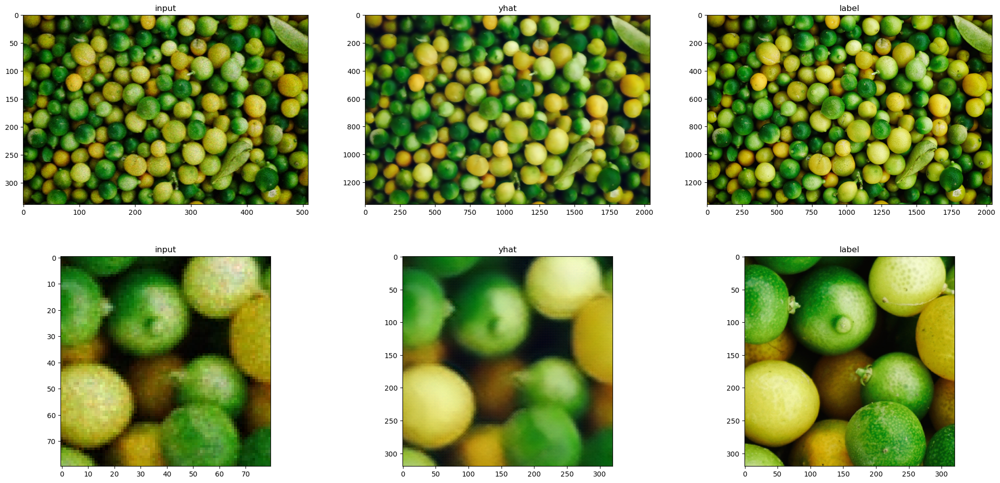

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


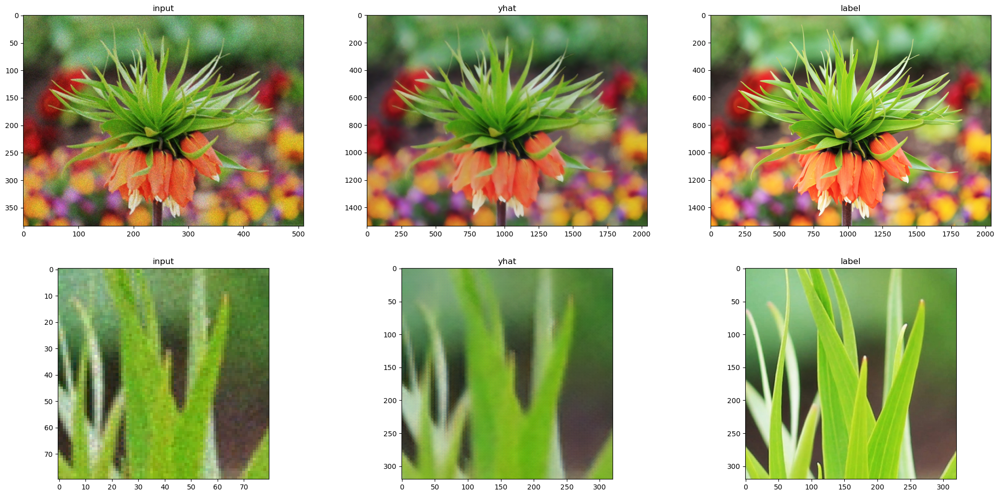

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


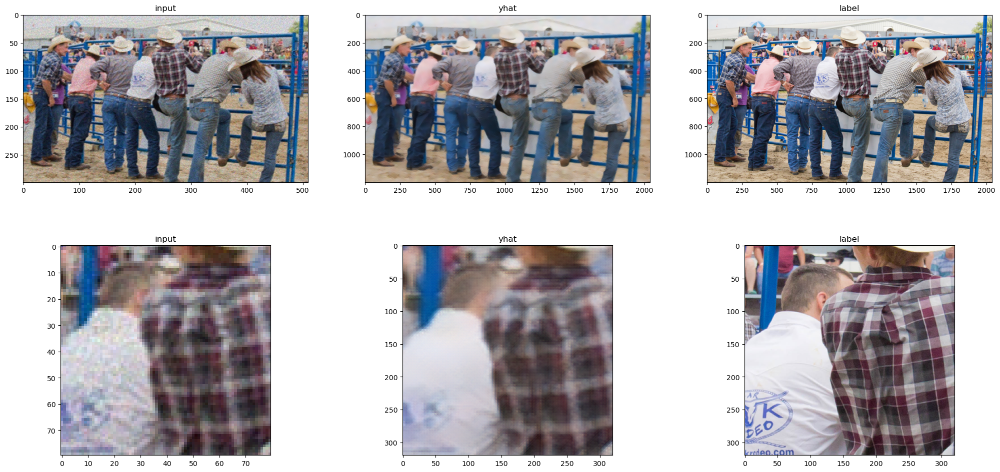

In [17]:
# plot a test example
for idx in range(len(yhat)):
    fig, ax = plt.subplots(2, 3, figsize=(25,12))

    ax[0,0].imshow(lr_images_test[idx].numpy()/np.amax(lr_images_test[idx].numpy()))
    ax[0,0].title.set_text("input")
    ax[0,1].imshow(yhat[idx][0]/np.amax(yhat[idx]))
    ax[0,1].title.set_text("yhat")
    ax[0,2].imshow(hr_images_test[idx].numpy()/np.amax(hr_images_test[idx].numpy()))
    ax[0,2].title.set_text("label")

    ax[1,0].imshow(lr_images_test[idx][50:130, 200:280].numpy()/np.amax(lr_images_test[idx].numpy()))
    ax[1,0].title.set_text("input")
    ax[1,1].imshow(yhat[idx][0,50*4:130*4, 200*4:280*4]/np.amax(yhat[idx]))
    ax[1,1].title.set_text("yhat")
    ax[1,2].imshow(hr_images_test[idx][50*4:130*4, 200*4:280*4].numpy()/np.amax(hr_images_test[idx].numpy()))
    ax[1,2].title.set_text("label")

    plt.show()